In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import plotly.express as px

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.preprocessing import StandardScaler

from IPython.display import display

In [2]:
dataframe = pd.read_csv('./train_dataset.csv')
validation = pd.read_csv('./test_dataset.csv')

In [3]:
dataframe

,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,relaxation,...,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,smoking
0,35,170,85,97.0,0.9,0.9,1,1,118,78,...,70,142,19.8,1,1.0,61,115,125,1,1
1,20,175,110,110.0,0.7,0.9,1,1,119,79,...,71,114,15.9,1,1.1,19,25,30,1,0
2,45,155,65,86.0,0.9,0.9,1,1,110,80,...,57,112,13.7,3,0.6,1090,1400,276,0,0
3,45,165,80,94.0,0.8,0.7,1,1,158,88,...,46,91,16.9,1,0.9,32,36,36,0,0
4,20,165,60,81.0,1.5,0.1,1,1,109,64,...,47,92,14.9,1,1.2,26,28,15,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38979,40,165,60,80.0,0.4,0.6,1,1,107,60,...,61,72,12.3,1,0.5,18,18,21,1,0
38980,45,155,55,75.0,1.5,1.2,1,1,126,72,...,76,131,12.5,2,0.6,23,11,12,0,0
38981,40,170,105,124.0,0.6,0.5,1,1,141,85,...,48,138,17.1,1,0.8,24,23,35,1,1
38982,40,160,55,75.0,1.5,1.5,1,1,95,69,...,79,116,12.0,1,0.6,24,20,17,0,1


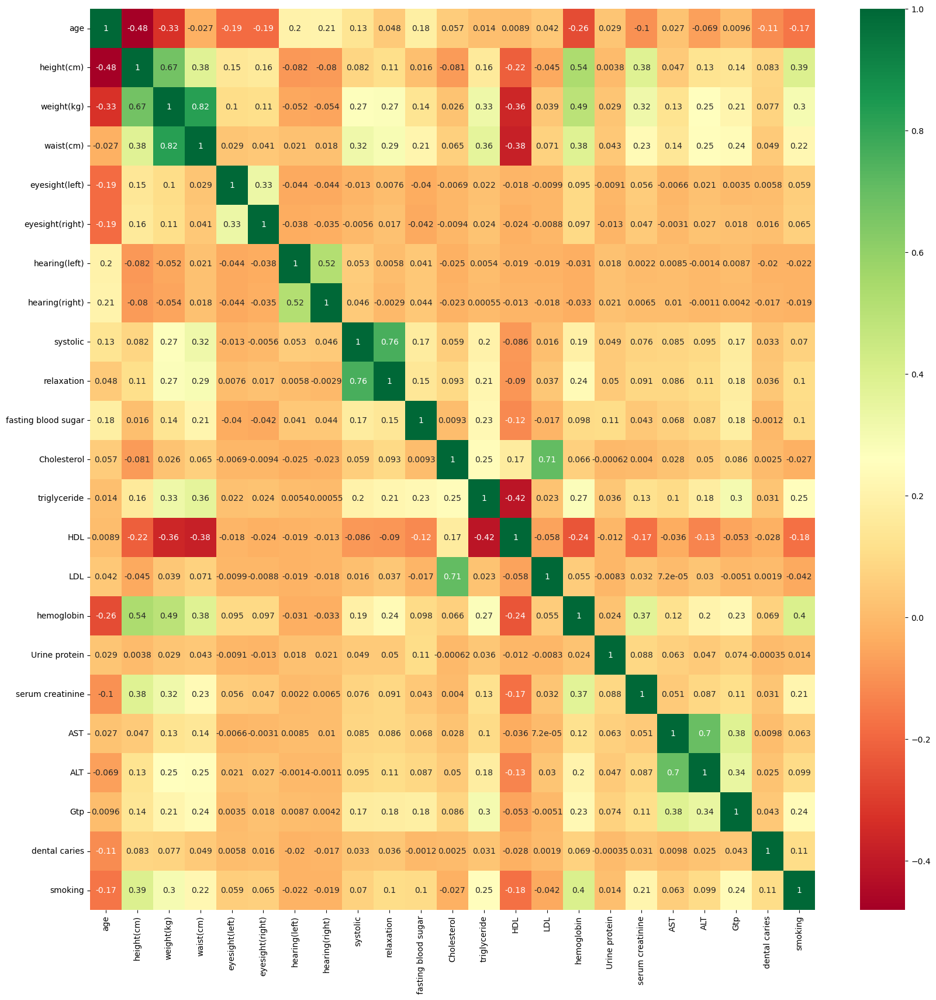

In [4]:
corrmat = dataframe.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(dataframe[top_corr_features].corr(),annot=True,cmap="RdYlGn")

height vs weight
weight vs waist
hearing r vs hearing l
systolic vs relaxation
ldl vs cholesterol
ast vs alt

/Users/ruhiaggarwal/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


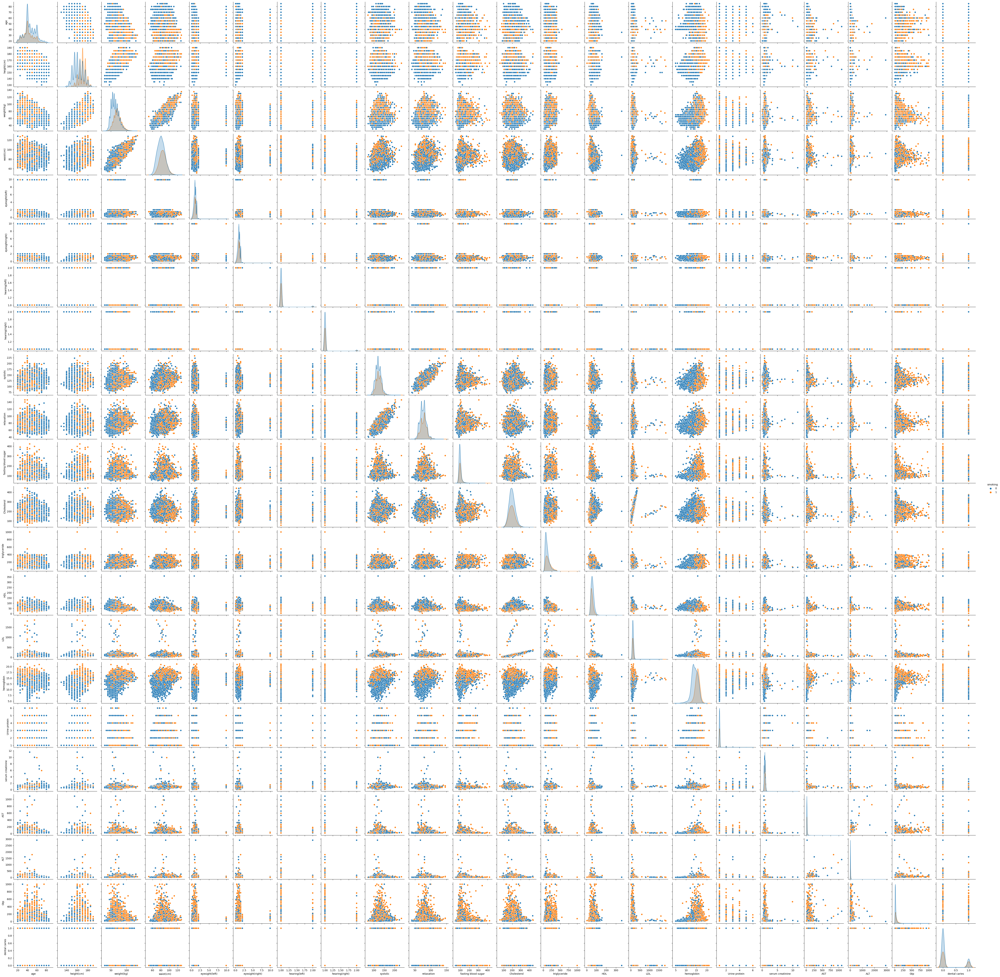

In [96]:
sns.pairplot(dataframe[top_corr_features], hue = 'smoking', diag_kind = 'kde')
plt.show()

[0.14770295 0.08142609 0.09547413 0.09211686 0.13939171 0.07495031
 0.08425321 0.08613839 0.11769319 0.08085317]


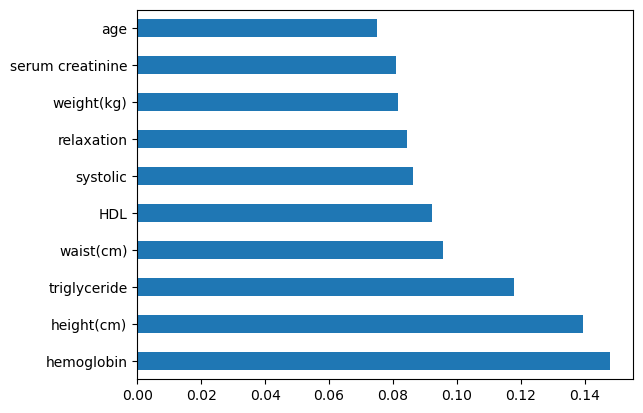

In [89]:
x_all = train.iloc[:,0:22]  #independent columns
y = train.iloc[:,-1]    #target column i.e price range
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(x,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=x.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

In [42]:
y = train[['smoking']]
x_manual = train[['hemoglobin', 'weight(kg)', 'waist(cm)', 'HDL', 'height(cm)', 'age', 'relaxation', 'systolic', 'triglyceride', 'serum creatinine']]

,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,relaxation,...,triglyceride,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries
0,35,170,85,97.0,0.9,0.9,1,1,118,78,...,153,70,142,19.8,1,1.0,61,115,125,1
1,20,175,110,110.0,0.7,0.9,1,1,119,79,...,128,71,114,15.9,1,1.1,19,25,30,1
2,45,155,65,86.0,0.9,0.9,1,1,110,80,...,120,57,112,13.7,3,0.6,1090,1400,276,0
3,45,165,80,94.0,0.8,0.7,1,1,158,88,...,366,46,91,16.9,1,0.9,32,36,36,0
4,20,165,60,81.0,1.5,0.1,1,1,109,64,...,200,47,92,14.9,1,1.2,26,28,15,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38979,40,165,60,80.0,0.4,0.6,1,1,107,60,...,53,61,72,12.3,1,0.5,18,18,21,1
38980,45,155,55,75.0,1.5,1.2,1,1,126,72,...,100,76,131,12.5,2,0.6,23,11,12,0
38981,40,170,105,124.0,0.6,0.5,1,1,141,85,...,196,48,138,17.1,1,0.8,24,23,35,1
38982,40,160,55,75.0,1.5,1.5,1,1,95,69,...,48,79,116,12.0,1,0.6,24,20,17,0


In [65]:
scaler = StandardScaler()

# Fit the scaler to the data
scaler.fit(x_all)

# Transform the data using the scaler
x_all_scaled = scaler.transform(x_all)


x_train_all, x_test_all, y_train, y_test = train_test_split(x_all_scaled, y, test_size = 0.2)
y_train = y_train.values.ravel()

In [59]:
logreg = LogisticRegression(penalty='l1', solver='liblinear', random_state = 0, max_iter = 1000)
logreg.fit(x_train_all, y_train)
predictions_log = logreg.predict(x_test_all)
print(classification_report(y_test, predictions_log))

              precision    recall  f1-score   support

           0       0.76      0.81      0.79      4936
           1       0.63      0.57      0.60      2861

    accuracy                           0.72      7797
   macro avg       0.70      0.69      0.69      7797
weighted avg       0.71      0.72      0.72      7797



In [60]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=1)


knn.fit(x_train_all, y_train)

predictions_knn = knn.predict(x_test_all)


print(classification_report(y_test, predictions_knn))

              precision    recall  f1-score   support

           0       0.80      0.80      0.80      4936
           1       0.65      0.66      0.65      2861

    accuracy                           0.75      7797
   macro avg       0.73      0.73      0.73      7797
weighted avg       0.75      0.75      0.75      7797



In [74]:
from sklearn.feature_selection import SequentialFeatureSelector
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
# Set up SFFS with knn classifier
sfs = SFS(knn, k_features = 10,
          forward=True, 
          floating=True, 
          scoring='accuracy',
          cv=5)

# Fit SFS
sfs = sfs.fit(x_train_all, y_train)

print('Selected features:', sfs.k_feature_idx_)
print('Feature Names:', sfs.k_feature_names_)
print('CV Score:', sfs.k_score_)

selected_features = list(sfs.k_feature_idx_)

# Assuming new_data is your new dataset you want to make predictions on
# Ensure new_data only includes the selected features
X_new_sfs10 = x_test_all[:, selected_features]

# Use the trained model to predict
predictions_sfs10 = knn.predict(X_new_sfs10)

# Now you have your predictions
print(predictions)
print(classification_report(y_test, predictions_sfs10))

Selected features: (0, 1, 6, 14, 15, 16, 17, 18, 19, 20)
Feature Names: ('0', '1', '6', '14', '15', '16', '17', '18', '19', '20')
CV Score: 0.7371659361185919


ValueError: X has 10 features, but KNeighborsClassifier is expecting 22 features as input.

In [90]:
from sklearn.feature_selection import SequentialFeatureSelector
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
# Set up SFFS with knn classifier
sfs = SFS(knn, k_features = 6,
          forward=True, 
          floating=True, 
          scoring='accuracy',
          cv=5)

# Fit SFS
sfs = sfs.fit(x_train_all, y_train)

print('Selected features:', sfs.k_feature_idx_)
print('Feature Names:', sfs.k_feature_names_)
print('CV Score:', sfs.k_score_)

Selected features: (1, 6, 12, 15, 19, 20)
Feature Names: ('1', '6', '12', '15', '19', '20')
CV Score: 0.7325486450740272


In [91]:
from sklearn.feature_selection import SequentialFeatureSelector
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
# Set up SFFS with knn classifier
sfs = SFS(knn, k_features = 4,
          forward=True, 
          floating=True, 
          scoring='accuracy',
          cv=5)

# Fit SFS
sfs = sfs.fit(x_train_all, y_train)

print('Selected features:', sfs.k_feature_idx_)
print('Feature Names:', sfs.k_feature_names_)
print('CV Score:', sfs.k_score_)

Selected features: (1, 12, 15, 20)
Feature Names: ('1', '12', '15', '20')
CV Score: 0.725173689905976
